# Generating Music with an Anticipatory Music Transformer

## Set up the machine

We use the fluidsynth library to synthesize audio from MIDI.

In [1]:
# !apt install fluidsynth

E: Could not open lock file /var/lib/dpkg/lock-frontend - open (13: Permission denied)
E: Unable to acquire the dpkg frontend lock (/var/lib/dpkg/lock-frontend), are you root?


Load the anticipation repository and install requirements.

In [2]:
# !git clone https://github.com/jthickstun/anticipation.git
# !pip install ./anticipation
# !pip install -r anticipation/requirements.txt

fatal: destination path 'anticipation' already exists and is not an empty directory.
Processing ./anticipation
  Preparing metadata (setup.py) ... done
  Created wheel for anticipation: filename=anticipation-1.0-py3-none-any.whl size=18602 sha256=ef45d7883222d5d2558a9d0a23d67404c1a0d5ec5f81833767e3f5d8657daf25
  Stored in directory: /tmp/pip-ephem-wheel-cache-ly7e1to4/wheels/03/71/f4/dd875125eee51dc7073da254983ed1b3b61b4aeb048cff8f34
Successfully built anticipation
  Attempting uninstall: anticipation
    Found existing installation: anticipation 1.0
    Uninstalling anticipation-1.0:
      Successfully uninstalled anticipation-1.0


## Set up the runtime environment

In [1]:
import sys,time

import mido
import midi2audio
import transformers
from transformers import AutoModelForCausalLM

from IPython.display import Audio

from anticipation import ops
from anticipation.sample import generate
from anticipation.tokenize import extract_instruments
from anticipation.convert import events_to_midi,midi_to_events
from anticipation.visuals import visualize
from anticipation.config import *
from anticipation.vocab import *

In [2]:
SMALL_MODEL = 'stanford-crfm/music-small-800k'     # faster inference, worse sample quality
MEDIUM_MODEL = 'stanford-crfm/music-medium-800k'   # slower inference, better sample quality

# load an anticipatory music transformer
model = AutoModelForCausalLM.from_pretrained(MEDIUM_MODEL).cuda()

# a MIDI synthesizer
fs = midi2audio.FluidSynth('/usr/share/sounds/sf2/FluidR3_GM.sf2')

# the MIDI synthesis script
def synthesize(fs, tokens, fileName = 'tmp'):
    mid = events_to_midi(tokens)
    mid.save(fileName + '.mid')
    fs.midi_to_audio(fileName + '.mid', fileName + '.wav')
    return fileName + '.wav'

Some weights of the model checkpoint at stanford-crfm/music-medium-800k were not used when initializing GPT2LMHeadModel: ['token_out_embeddings']
- This IS expected if you are initializing GPT2LMHeadModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing GPT2LMHeadModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


## Simple Interaction with the Anticipatory Music Transformer

### Prompted generation

We can use the music generated in the previous cell as a prompt to generate a longer segment of music. A natural interactive paradigm for music composition is to interatively ask the model to generate a proposal for the next for few seconds of music, and either accept this proposal and continue or reject the proposal and ask the model to try again.

This control flow is illustrated by the following figure:

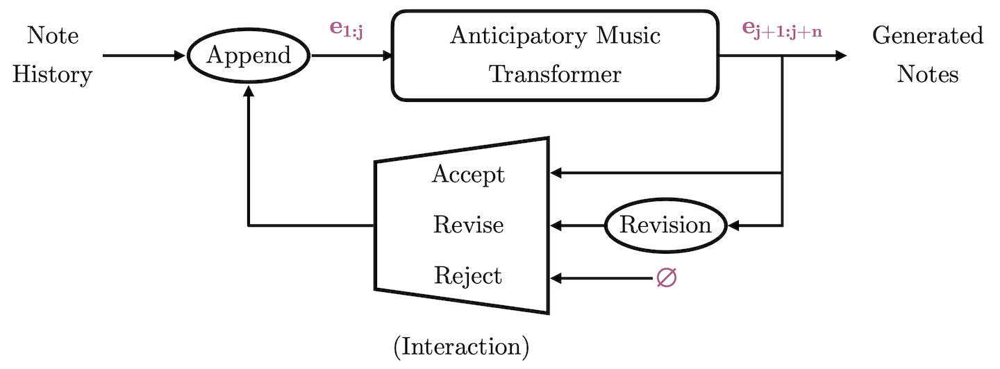

In [18]:
# Step 1: Setup Variables and Load Original Tracks
length = 30  # 30 seconds
extended_time = 5
top_p=0.78

new_clip_title = ['mozart', 'even-more-night-music']
track_number = 1
step_number = 1

audio_mozart_influenced = midi_to_events('anticipation/examples/Eine_Kleine_Nachtmusik.midi')
audio_glass_influenced = midi_to_events('anticipation/examples/Eine_Kleine_Nachtmusik.midi')

audio_mozart_influenced_x_2 = midi_to_events('output/mozart/more-night-music_0.78_2-7.mid')

clipped_audio = ops.clip(audio_mozart_influenced_x_2, 0, length)

print('length: ', length)
print('track_step: ', str(track_number) + '_' + str(step_number))

length:  30
track_step:  1_1


We prompt the model by specifying `inputs`, and ask the model to continue generating music, starting from the end of the previous prompt (`start_time=length`). In this example, we ask the model to generate an additional 5 seconds of music.

In [32]:
# Step 2: generate n seconds of music following the prompt
# re-run this cell immediate to reject the proposal
# or run the next cell to accept the proposal
track_number = 2
print('length: ', length)
print('track_step: ', str(track_number) + '_' + str(step_number))

proposal = generate(model, start_time=length, end_time=length+extended_time, inputs=clipped_audio, top_p=top_p)
Audio(synthesize(fs, proposal, new_clip_title[1]))

length:  60
track_step:  2_7


 90%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏              | 450/500 [00:12<00:01, 37.41it/s]


FluidSynth runtime version 2.1.1
Copyright (C) 2000-2020 Peter Hanappe and others.
Distributed under the LGPL license.
SoundFont(R) is a registered trademark of E-mu Systems, Inc.

Rendering audio to file 'even-more-night-music.wav'..


After generating a candidate continuation `proposal`, we can choose to either accept this proposal (running the following cell to append the proposed continuation to the prompt) or reject the proposal (run the previous cell again).

In [33]:
# Step 3: accept the proposal
clipped_audio = proposal
length += extended_time
step_number += 1

print('length: ', length)
print('track_number: ', track_number)

# re-run Step 2 to continue generating music

length:  65
track_number:  2


We can save the resulting music to a MIDI file.

In [34]:
midi = events_to_midi(proposal)

import os
if not os.path.exists('output/' + new_clip_title[0]):
   os.makedirs('output/' + new_clip_title[0])

midi.save('output/' + new_clip_title[0] + '/' + new_clip_title[1] + '_' + str(top_p) + '_' + str(track_number) + '-' + str(step_number) + '.mid')

track_number += 1
clipped_audio = ops.clip(audio_mozart_influenced, 0, length)

In [25]:
Other ideas....generate a piece influenced off of the original influence

## Loading your own MIDI

You can load your own MIDI as follows. Here, we synthesize the first 30 seconds of the loaded MIDI file by clipping the loaded sequence of events. The `ops.clip` function takes a list of `events`, a `start_time`, and an `end_time`, and returns the events in the interval [`start_time`,`end_time`].



In [ ]:
events = midi_to_events('anticipation/examples/strawberry.mid')
Audio(synthesize(fs, ops.clip(events, 0, 30)))

Here's another example of clipping. This time, we clip 16 seconds of music starting 41 seconds into the music. The clipping operation simply discards events outside the specified region; often we will want to translate this clip to start from time 0. We can do this using `ops.translate`.

For the clip operation, we specified time in units of seconds. Time in our models is quantized at a much finer rate (10ms quantization). To be precise about timing, we can specify time using this fine-grained quantization. By specifying the `seconds=False` flag to `ops.min_time`, we retrieve the minimum time in the `segment` measured in 10ms resolution. Many of the utilities in the `ops` library provide an option time to be specified in either seconds or 100ths of a second.

In [ ]:
segment = ops.clip(events, 41, 41+16)
segment = ops.translate(segment, -ops.min_time(segment, seconds=False))
Audio(synthesize(fs, segment))

### Span Infilling

We can use anticipation to infill a span of time. To do this, we treat the history (in this case, the first 6 seconds) as a prompt, and the future (the
last 5 seconds) as anticipated events. We mark anticipated events as a control by adding CONTROL_OFFSET to each item in the sequence. We can use the `ops.combine` method to recombine a sequence of events and control events.



In [ ]:
history = ops.clip(segment, 0, 6, clip_duration=False)
anticipated = [CONTROL_OFFSET + tok for tok in ops.clip(segment, 11, 16, clip_duration=False)]
Audio(synthesize(fs, ops.combine(history, anticipated)))

To infill the missing span, we specify the anticipated events at the end of the span using the `controls` input to the `generate` function.

In [ ]:
inpainted = generate(model, 6, 11, inputs=history, controls=anticipated, top_p=.95)
Audio(synthesize(fs, ops.combine(inpainted, anticipated)))

### Accompaniment

Now let's see how to generate an accompaniment given a melodic line. We use the `extract_instruments` method to extract the melodic instrument (in this case, MIDI instrument code 53) from the music.

In [ ]:
segment = ops.clip(events, 41, 41+20)
segment = ops.translate(segment, -ops.min_time(segment, seconds=False))

print(ops.get_instruments(segment).keys())
events, melody = extract_instruments(segment, [53])
Audio(synthesize(fs, melody))

We are going to prompt the model using a 5-second clip from the beginning of the segment, plus the melody for the full 20-second segment. Here's what the prompt sounds like.

In [ ]:
history = ops.clip(events, 0, 5, clip_duration=False)
Audio(synthesize(fs, history + melody))

And we generate an accompaniment, conditioning on 5 seconds of `history` and accompanying the subsequent 15 seconds `melody`, which we condition on as anticipated controls.

In [ ]:
accompaniment = generate(model, 5, 20, inputs=history, controls=melody, top_p=.95, debug=False)
output = ops.clip(ops.combine(accompaniment, melody), 0, 20, clip_duration=True)
Audio(synthesize(fs, output))

## A Richer Interactive Control Flow

To create the co-compositions featured in Example 3 of the accompanying [blog post](https://crfm.stanford.edu/2023/06/14/anticipatory-music-transformer.html?idx=1#demo-example), we used a control flow that combines the iterative interaction flow described above together with melodic control inputs.

This modified control flow is illustrated by the following Figure:

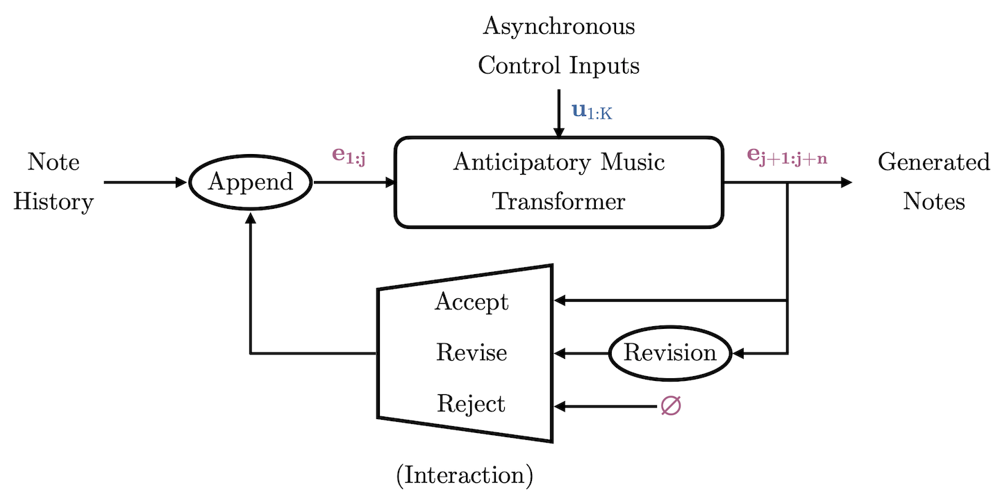

### Loading the initial note history and controls

First we load an initial MIDI to start our editing process:

In [ ]:
events = midi_to_events('anticipation/examples/strawberry.mid')
segment = ops.clip(events, 41, 41+45)
segment = ops.translate(segment, -ops.min_time(segment, seconds=False))
Audio(synthesize(fs, segment))

We extract the melody to use as control inputs:

In [ ]:
print(ops.get_instruments(segment))
events, melody = extract_instruments(segment, [53])
Audio(synthesize(fs, melody))

And we extract the first 5 seconds to use as a prompt:

In [ ]:
length = 5
prompt = ops.clip(events, 0, length, clip_duration=False)
Audio(synthesize(fs, prompt))

### The control loop

**Generate** new events (re-run this cell to reject the previous proposal)

In [ ]:
n = 5              # choose how many seconds of music to generate
nucleus_p = 0.98   # choose a nucleus sampling probability

proposal = generate(model, start_time=length, end_time=length+n, inputs=prompt, controls=melody, top_p=nucleus_p)

**Inspect** the proposed output

In [ ]:
offset = 0   # an offset for the audio preview (set this to > 0 to clip the beginning of the sequence)

output = ops.clip(ops.combine(proposal, melody), offset, length+n, clip_duration=True)
output = ops.translate(output, -ops.min_time(output, seconds=False))
Audio(synthesize(fs, output))

In [ ]:
visualize(proposal, 'output.png') # visualize the proposed generation

In [ ]:
print(ops.get_instruments(proposal)) # the number of notes for each instrument contained in the proposal

**Accept** the proposed output

In [ ]:
prompt = proposal
length += n

**Revise** the proposed output: delete an instrument from the proposed generation

In [ ]:
instr = 128
candidate = ops.delete(proposal, lambda token: (token[2]-NOTE_OFFSET)//2**7 == instr)
output = ops.clip(ops.combine(candidate, melody), 0, length+n, clip_duration=True)
Audio(synthesize(fs, output))

In [ ]:
# accept the revision
proposal = candidate

**Revise** the proposed output: revert to an earlier generation timepoint

In [ ]:
reversion = length+2
candidate = ops.clip(proposal, 0, reversion, clip_duration=False)
output = ops.clip(ops.combine(candidate, melody), 0, length+n, clip_duration=True)
Audio(synthesize(fs, candidate))

In [ ]:
# accept the revision
prompt = candidate
length = reversion

**Save** the proposed output

In [ ]:
mid = events_to_midi(proposal)
mid.save('strawberry-1.mid')